In [1]:
def _generate_frame_differences(video_path):

    cap = cv2.VideoCapture(str(video_path))
    if not cap.isOpened():
        raise OSError(f"Could not open video: {video_path}")

    diffs = []
    prev_gray = None
    try:
        while True:
            ok, frame = cap.read()
            if not ok or frame is None:
                break

            if frame.ndim == 3:
                gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            else:
                gray = frame

            gray = gray.astype(np.float32, copy=False)

            if prev_gray is None:
                diffs.append(0.0)
            else:
                diff_val = np.mean(np.abs(gray - prev_gray))
                print('appending diff')
                diffs.append(float(diff_val))

            prev_gray = gray
    finally:
        cap.release()

    return np.array(diffs, dtype=float)

In [111]:
%reload_ext autoreload
%autoreload 2
import slap2_py as spy
import wisco_slap as wis
import wisco_slap.defs as DEFS
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import os
import numpy as np
import matplotlib as mpl
import h5py
import glob
import polars as pl
from pathlib import Path
import tifffile
import seaborn as sns
import electro_py as epy
import cv2

In [48]:
subject = 'kaus'
exp = 'exp_1'
sb=1
locs = ['loc_E']
loc = 'loc_E'
acq = 'acq_1'

In [ ]:
sd_video_path = f'{DEFS.data_root}/{subject}/{exp}/{subject}--{exp}--SD.mp4'
sdnp = _generate_frame_differences(sd_video_path)
np.save(f'{DEFS.data_root}/{subject}/{exp}/SD-DIFFS.npy', sdnp)

In [ ]:
sd_diffs = np.load(f'{DEFS.data_root}/{subject}/{exp}/SD-DIFFS.npy')

In [5]:
ephys = wis.peri.ephys.load_exp_ephys_data(subject, exp, stores=['EEG_', 'loal'])

read from t=0s to t=8711.25s
Using 610.3516 Hz as SEV sampling rate for EEG_
read from t=0s to t=8711.25s


In [6]:
eyedf = wis.peri.vid.load_eye_metric_df(subject, exp, sb=sb)
whis = wis.peri.vid.load_whisking_df(subject, exp, sb=sb)

In [29]:
hypno = wis.peri.vig.load_auto_hypno(subject, exp, sb, filter_unclear=0.55)

# Plot SD Activity

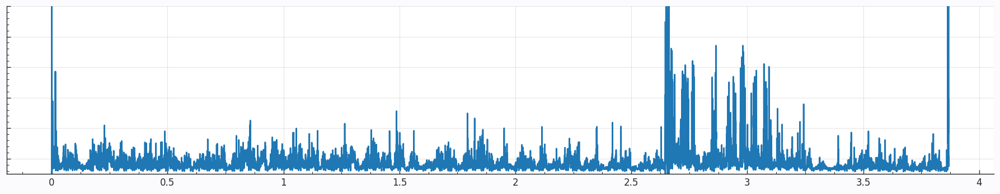

In [48]:
spy.plot.slap_style(version='fig')
f, ax = plt.subplots(1, 1, figsize=(15, 3), sharex=True)
ax.plot(sdnp[::30])
ax.set_ylim(2.5, 8)
ax.set_xticks([0, 0.18e4, 0.36e4, 0.54e4, 0.72e4, 0.9e4, 1.08e4, 1.26e4, 1.44e4])
ax.set_xticklabels([0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4])
ax.set_yticklabels([])
plt.tight_layout()
plt.savefig(f"{DEFS.plots_root}/{subject}-{exp}--SD-DIFFS.svg", transparent=True, bbox_inches='tight')

# Peripheral Data During Recording

In [20]:
d = ephys['EEG_'].data[::6]
t = ephys['EEG_'].time.values[::6]

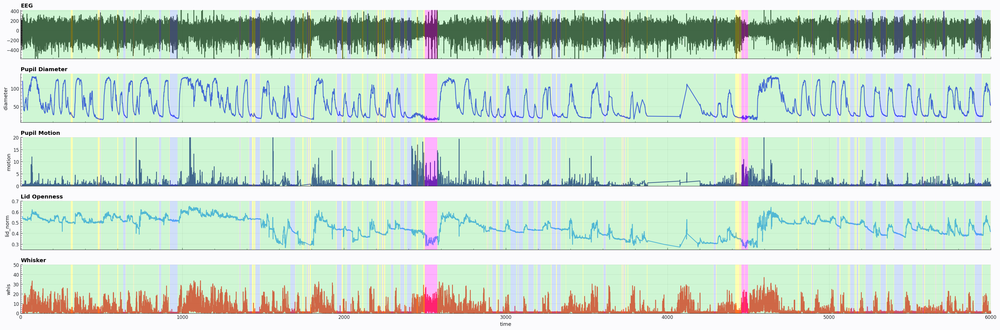

In [31]:
f, ax = plt.subplots(5, 1, figsize=(30, 10), sharex=True)
ax[0].plot(t, d, color='k', alpha=0.8)
ax[0].set_ylim(-580, 420)
ax[0].set_title('EEG')
sns.lineplot(data=eyedf.filter(pl.col('pup_likelihood') > 0.7), x='time', y='diameter', ax=ax[1], color='blue', alpha=0.8)
ax[1].set_title('Pupil Diameter')
sns.lineplot(data=eyedf.filter(pl.col('pup_likelihood') > 0.7), x='time', y='motion', ax=ax[2], color='navy', alpha=0.8)
ax[2].set_title('Pupil Motion')
ax[2].set_ylim(0, 20)
sns.lineplot(data=eyedf.filter(pl.col('lid_likelihood') > 0.7), x='time', y='lid_norm', ax=ax[3], color='dodgerblue', alpha=0.8)
ax[3].set_title('Lid Openness')
ax[3].set_ylim(0.25, 0.7)

sns.lineplot(data=whis, x='time', y='whis', ax=ax[4], color='red', alpha=0.8)
ax[4].set_title('Whisker')
ax[4].set_ylim(0, 50)

for a in ax:
    a.set_xlim(0, 6000)
    epy.plot.utils.shade_hypno_for_me(hypno, a, alpha=0.3)
plt.tight_layout()
f.savefig(f"{DEFS.plots_root}/{subject}-{exp}--EEG-eye-whisker.png", transparent=True, bbox_inches='tight', dpi=300)

# Imaging Data

In [49]:
# mean images
mim = wis.scope.io.load_mean_ims(subject, exp, loc, acq)

(2, 887, 672)
(2, 891, 518)


In [112]:
fp = wis.scope.io.load_fprts(subject, exp, loc, acq)

In [ ]:
spy.plot.slap_style(version='im')

In [128]:
fp1 = fp[1]
fp2 = fp[2]

In [129]:
fp1[fp1 == 0] = np.nan
fp2[fp2 == 0] = np.nan

In [138]:
fp1_max = np.nanmax(fp1, axis=0)
fp2_max = np.nanmax(fp2, axis=0)

/tmp/ipykernel_2241303/2992677254.py:1: RuntimeWarning: All-NaN slice encountered
  fp1_max = np.nanmax(fp1, axis=0)
/tmp/ipykernel_2241303/2992677254.py:2: RuntimeWarning: All-NaN slice encountered
  fp2_max = np.nanmax(fp2, axis=0)


In [140]:
np.nanpercentile(fp1_max, 98)

np.float32(4545.172)

In [143]:
spy.plot.slap_style(version='im')

11.2 14.783333333333333


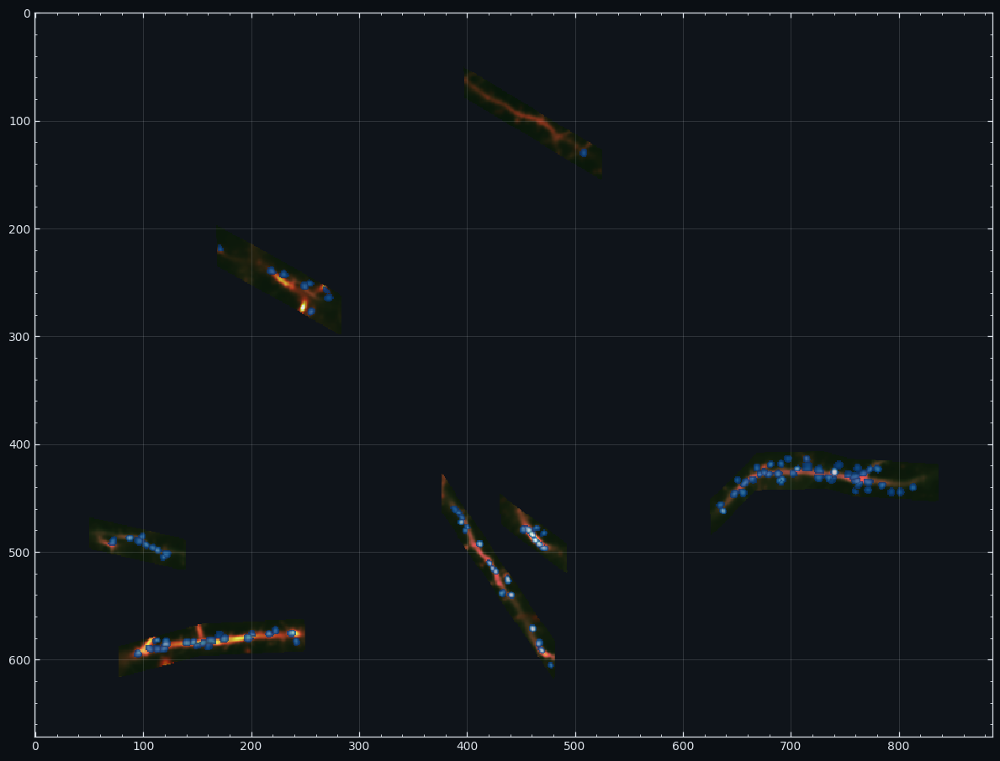

In [147]:
mean_im = mim[1][1, :, :]
mean_ca = mim[1][0, :, :]
fig_height = mean_im.shape[0] / 60
fig_width = mean_im.shape[1] / 60
print(fig_height, fig_width)
fig, ax = plt.subplots(1, 1, figsize=(fig_width, fig_height))
ax.imshow(mim[1][1, :, :], cmap='Greens_r', vmin=0, vmax=70, alpha=0.8)
ax.imshow(mean_ca, cmap='hot', vmin=0, vmax=70, alpha=0.6)
ax.imshow(fp1_max, cmap='Blues_r', alpha=0.8)
fig.savefig(f"{DEFS.plots_root}/{subject}-{exp}--{loc}--mean-im-dmd1.png", transparent=False, bbox_inches='tight', dpi=300)

8.633333333333333 14.85


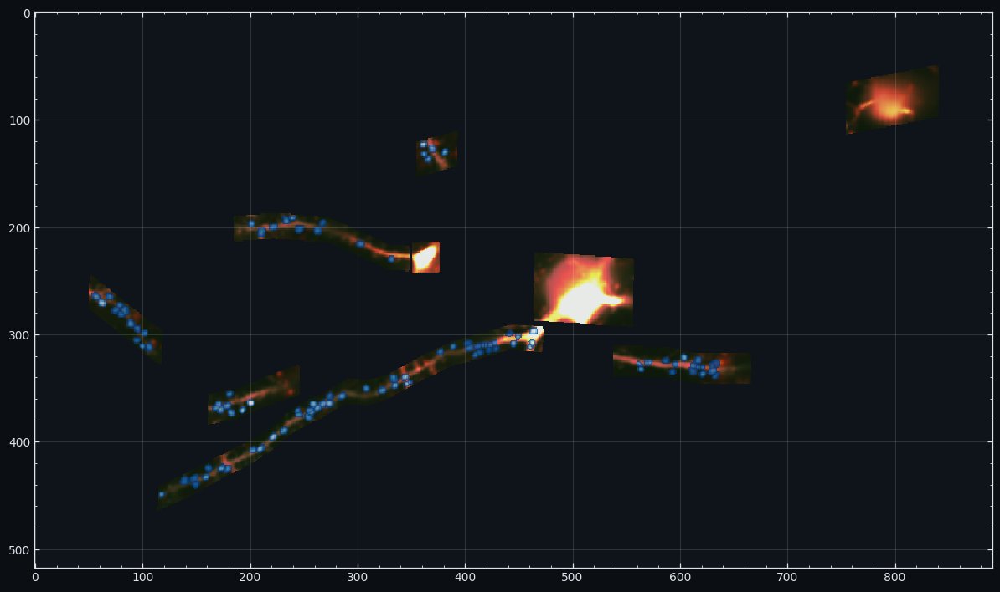

In [148]:

mean_im = mim[2][1, :, :]
mean_ca = mim[2][0, :, :]
fig_height = mean_im.shape[0] / 60
fig_width = mean_im.shape[1] / 60
print(fig_height, fig_width)
fig, ax = plt.subplots(1, 1, figsize=(fig_width, fig_height))
ax.imshow(mean_im, cmap='Greens_r', vmin=0, vmax=70, alpha=0.8)
ax.imshow(mean_ca, cmap='hot', vmin=0, vmax=70, alpha=0.6)
ax.imshow(fp2_max, cmap='Blues_r', alpha=0.8)
fig.savefig(f"{DEFS.plots_root}/{subject}-{exp}--{loc}--mean-im-dmd2.png", transparent=False, bbox_inches='tight', dpi=300)

In [ ]:
soma_dfs = []
for loc in locs:
    soma_df = wis.scope.io.load_roidf(subject, exp, loc, acq, apply_ephys_offset=True)
    soma_dfs.append(soma_df)
sdf = pl.concat(soma_dfs)

In [ ]:
syndfs = []
for loc in locs:
    syndf = wis.scope.io.load_syndf(subject, exp, loc, acq, trace_types=['matchFilt'], apply_ephys_offset=True)
    syndfs.append(syndf)
syndf = pl.concat(syndfs)

In [18]:
sdf = sdf.sort('time', descending=False)
syndf = syndf.sort('time', descending=False)

In [16]:
spy.plot.slap_style(version='fig')

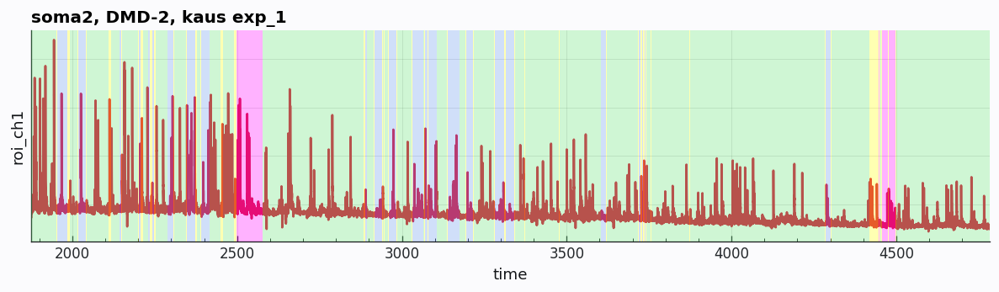

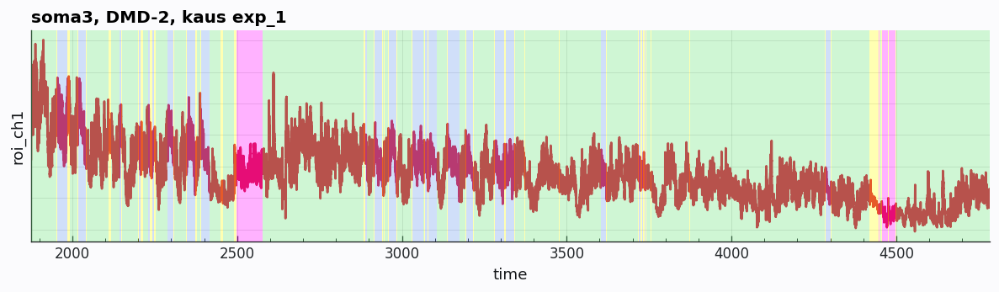

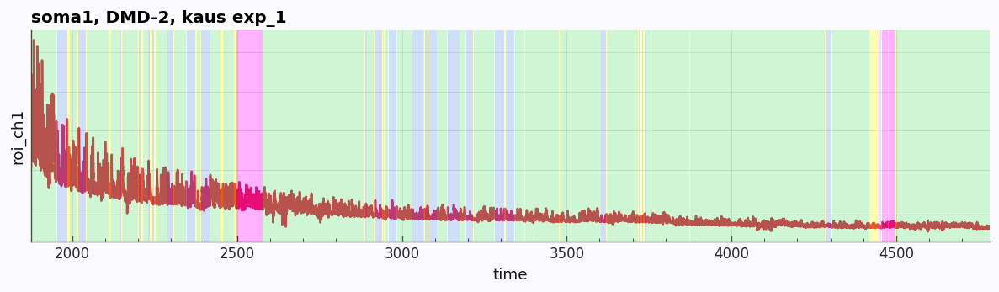

In [47]:
for soma_id in sdf['roi_name'].unique():
    f, ax = plt.subplots(1, 1, figsize=(10, 3))
    sdf_roi = sdf.filter(pl.col('roi_name') == soma_id)
    ax = sns.lineplot(data=sdf_roi, x='time', y='roi_ch1', ax=ax, color='crimson', alpha=1)
    #ax.set_yscale('log')
    ax.set_title(f"{soma_id}, DMD-2, {subject} {exp}")
    ax.set_yticklabels([])
    ax.tick_params(axis='y', which='both', left=False, labelleft=False)
    epy.plot.utils.shade_hypno_for_me(hypno, ax, alpha=0.3)
    plt.tight_layout()
    ax.set_xlim(sdf_roi['time'].min(), sdf_roi['time'].max())
    plt.savefig(f"{DEFS.plots_root}/{subject}-{exp}--{soma_id}.png", transparent=True, bbox_inches='tight', dpi=300)

In [32]:
mf = syndf.filter(pl.col('trace_type') == 'matchFilt')

In [33]:
start_time = mf['time'].min()

In [ ]:
plt.rcdefaults()

In [109]:
dmd=1
quick_dat = mf.filter(pl.col('source') < 120).filter(pl.col('time')>start_time+0).filter(pl.col('time')<start_time+4000).filter(pl.col('dmd')==dmd)
source_dats = []
for source in quick_dat['source'].unique():
    source_dats.append(quick_dat.filter(pl.col('source') == source)['data'].to_numpy())
source_dats = np.array(source_dats)
source_dats.shape

(107, 581853)

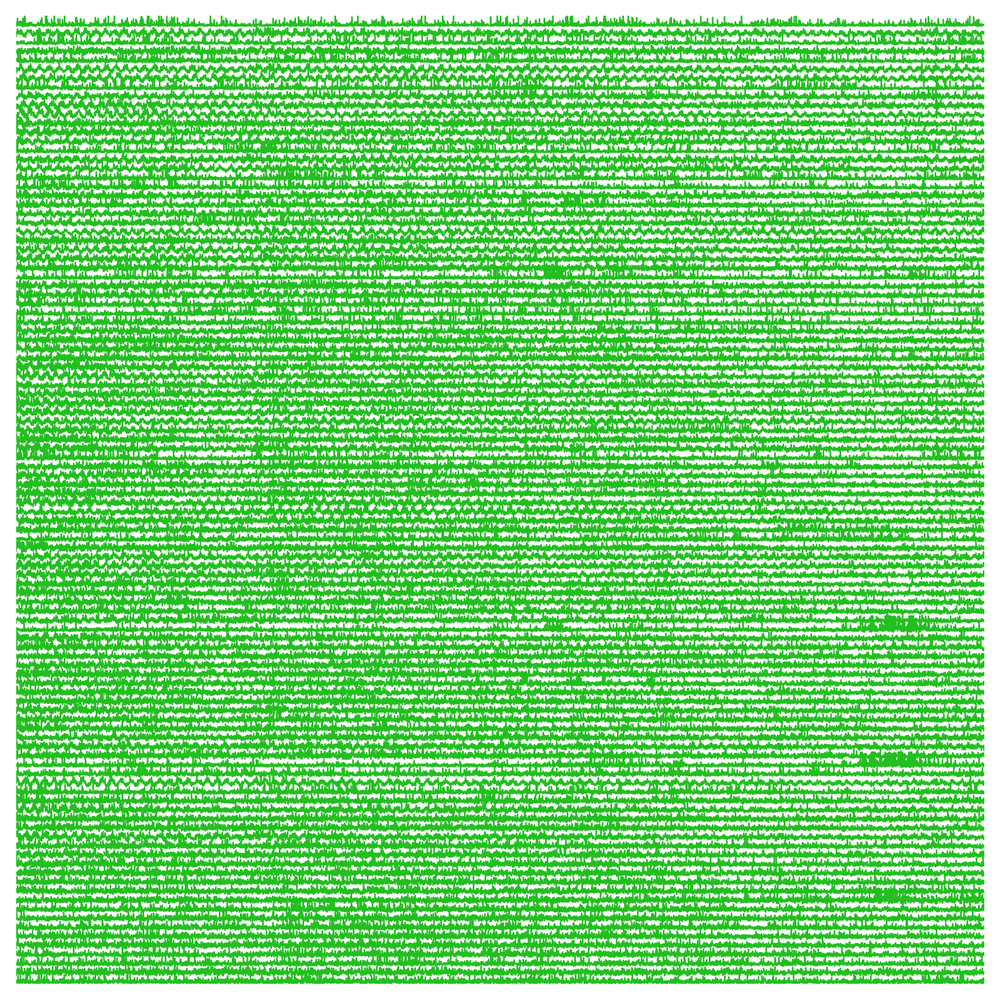

In [110]:
f, ax = spy.plot.main.plot_synaptic_traces(source_dats, 200, normalize='none')
#ax.axvline(600)
#ax.axvline(660)

plt.savefig(f"{DEFS.plots_root}/{subject}-{exp}--syn-traces-dmd{dmd}.png", transparent=True, bbox_inches='tight', dpi=300)

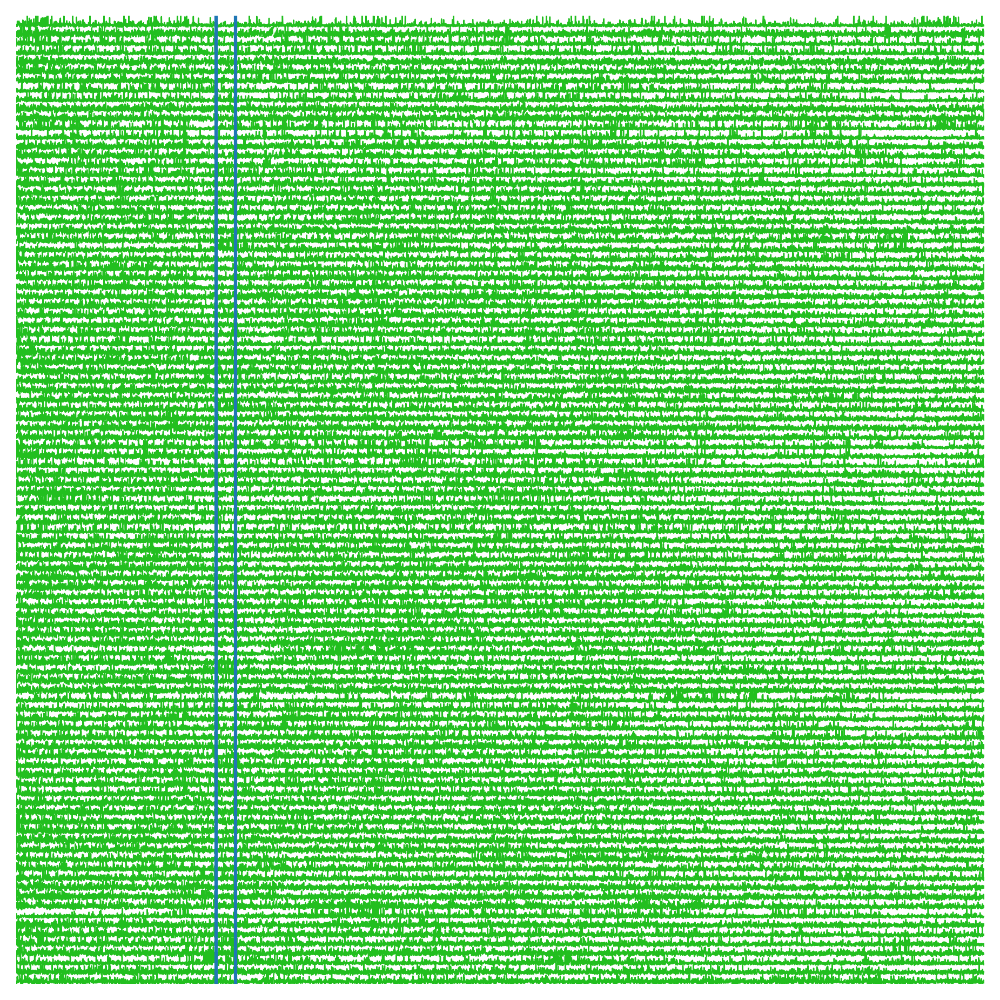

In [106]:
f, ax = spy.plot.main.plot_synaptic_traces(source_dats, 200, normalize='none')
ax.axvline(600)
ax.axvline(660)

plt.savefig(f"{DEFS.plots_root}/{subject}-{exp}--syn-traces-dmd{dmd}--labelled.png", transparent=True, bbox_inches='tight', dpi=300)

In [107]:
quick_dat_short = mf.filter(pl.col('source') < 120).filter(pl.col('time')>start_time+600).filter(pl.col('time')<start_time+660).filter(pl.col('dmd')==dmd)
source_short = []
for source in quick_dat_short['source'].unique():
    source_short.append(quick_dat_short.filter(pl.col('source') == source)['data'].to_numpy())
source_short = np.array(source_short)
source_short.shape

(103, 11999)

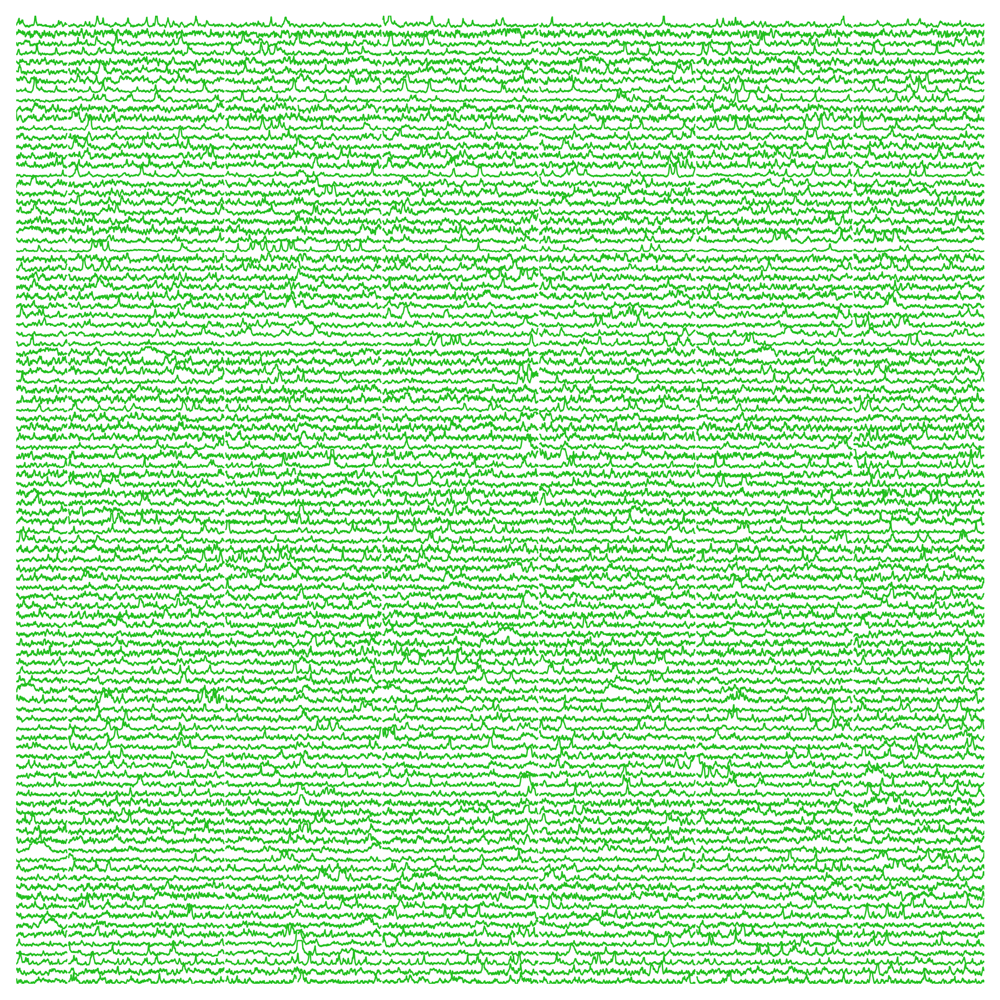

In [108]:
f, ax = spy.plot.main.plot_synaptic_traces(source_short, 200, normalize='none')
f.savefig(f"{DEFS.plots_root}/{subject}-{exp}--syn-traces-dmd{dmd}--short-window.png", transparent=True, bbox_inches='tight', dpi=300)